pip install the following
    -fredapi
    -matplotlib
    -plotly

In [1]:
import plotly.express as px
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

plt.style.use('fivethirtyeight')

In [2]:
from fredapi import Fred
pd.options.display.max_columns = 500
color_pal = plt.rcParams["axes.prop_cycle"].by_key()["color"]

In [3]:
fred_key = '2d7e03433b167ad69c66107a993cf3e2'

In [4]:
# 1. Create the Fred object

In [5]:
fred = Fred(api_key=fred_key)

# 2. Search for Economic data

In [6]:
sp_search = fred.search('S&P', order_by='popularity')

In [7]:
# sp_search[sp_search['id']=='SP500']

# 3. Pull raw data and plot

In [8]:
sp500 = fred.get_series(series_id='SP500')

In [9]:
# sp500.plot(figsize=(10,5), title='S&P 500', lw=2)

# 4. Pull and join multiple data series

In [10]:
unemp_df = fred.search('unemployment rate state', filter=('frequency', 'Monthly'))
unemp_df = unemp_df.query('seasonal_adjustment == "Seasonally Adjusted" and units == "Percent"')
unemp_df = unemp_df.loc[unemp_df['title'].str.contains('Unemployment Rate')]

In [11]:
unemp_df = unemp_df[unemp_df['title'].str.contains('Unemployment Rate in')]
unemp_df = unemp_df[unemp_df['id'].str.contains('UR')]

In [12]:
all_results=[]
for item in unemp_df.index:
    results = fred.get_series(item).to_frame(item)
    all_results.append(results)

unemp_states = pd.concat(all_results, axis=1)

In [13]:
# unemp_states = unemp_results.drop('UNRATE', axis=1)
unemp_states = unemp_states.filter(regex = "UR")

In [14]:
unemp_states = unemp_states[unemp_states.isna().sum(axis=1)<20]
id_to_state = unemp_df['title'].str.replace('Unemployment Rate in', '').to_dict()
unemp_states.columns = [id_to_state[c] for c in unemp_states.columns]

In [15]:
unemp_states = unemp_states.fillna(0)
unemp_states

,California,Texas,New York,Florida,Pennsylvania,Ohio,Michigan,Alabama,Massachusetts,North Carolina,Illinois,New Jersey,Georgia,Colorado,Arizona,Wisconsin,Virginia,Kentucky,South Carolina,New Mexico,Minnesota,Tennessee,Washington,Maryland,Oregon,West Virginia,Nevada,Arkansas,Oklahoma,Missouri,Alaska,Iowa,Utah,Puerto Rico,Indiana,Louisiana,Hawaii,North Dakota,Montana,the District of Columbia,Mississippi,Maine,Nebraska,Connecticut,Idaho,New Hampshire,Rhode Island,Kansas,Wyoming,Delaware,Vermont,South Dakota,Midwest Census Region,South Census Region,Northeast Census Region,West Census Region,New England Census Division
1976-01-01,9.2,5.8,10.3,9.7,8.0,8.1,9.9,6.6,10.5,6.4,6.6,10.3,8.4,5.8,10.2,5.8,6.1,5.6,7.4,8.6,6.0,6.0,8.5,6.4,9.5,7.5,9.2,7.3,5.8,5.9,7.1,4.3,5.8,19.6,6.6,6.3,9.8,3.4,5.8,8.7,6.7,8.7,3.3,9.8,5.6,6.5,7.8,4.2,4.1,8.0,8.6,3.3,6.8,6.9,9.6,8.6,9.6
1976-02-01,9.2,5.8,10.3,9.7,8.1,8.1,9.9,6.6,10.5,6.4,6.6,10.3,8.4,5.7,10.2,5.8,6.1,5.6,7.4,8.7,6.0,6.0,8.5,6.4,9.5,7.5,9.2,7.3,5.8,5.9,7.1,4.3,5.9,19.5,6.6,6.3,9.8,3.4,5.8,8.7,6.7,8.7,3.3,9.8,5.6,6.5,7.8,4.2,4.1,8.0,8.6,3.3,6.8,6.9,9.6,8.6,9.6
1976-03-01,9.1,5.9,10.2,9.6,8.1,8.1,9.9,6.6,10.5,6.4,6.6,10.3,8.4,5.7,10.1,5.7,6.1,5.6,7.3,8.7,5.9,6.0,8.4,6.4,9.4,7.5,9.2,7.3,5.8,5.9,7.0,4.3,5.8,19.3,6.5,6.3,9.8,3.4,5.8,8.6,6.6,8.6,3.3,9.8,5.6,6.5,7.7,4.2,4.1,8.0,8.6,3.2,6.8,6.9,9.6,8.6,9.6
1976-04-01,9.1,5.9,10.2,9.5,8.1,8.0,9.8,6.5,10.3,6.3,6.6,10.3,8.3,5.6,10.0,5.6,6.0,5.6,7.2,8.6,5.8,6.0,8.5,6.4,9.2,7.5,9.0,7.2,5.8,6.0,6.9,4.2,5.8,19.0,6.3,6.4,9.7,3.5,5.8,8.5,6.4,8.6,3.2,9.6,5.6,6.5,7.7,4.2,4.0,8.1,8.6,3.1,6.7,6.8,9.5,8.5,9.4
1976-05-01,9.0,5.9,10.1,9.3,8.1,7.8,9.6,6.4,10.1,6.1,6.6,10.3,8.1,5.6,9.8,5.5,5.9,5.5,7.0,8.6,5.7,5.9,8.5,6.5,9.1,7.4,8.9,7.1,5.7,6.0,6.9,4.1,5.7,18.9,6.0,6.5,9.4,3.6,5.8,8.4,6.3,8.5,3.1,9.4,5.6,6.5,7.7,4.2,3.9,8.3,8.5,3.1,6.6,6.7,9.5,8.5,9.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-03-01,5.3,3.9,4.3,3.2,3.4,3.8,3.9,3.0,2.9,3.5,4.8,4.8,3.1,3.7,3.8,3.0,2.9,4.5,3.1,3.8,2.7,3.2,4.8,2.5,4.2,4.3,5.1,3.5,3.5,3.3,4.6,2.9,2.8,5.8,3.5,4.4,3.1,2.0,3.3,5.2,3.0,3.3,2.5,4.5,3.3,2.6,4.1,2.7,2.8,3.9,2.2,2.1,3.6,3.4,3.9,4.6,3.3
2024-04-01,5.3,4.0,4.2,3.3,3.4,4.0,3.9,3.1,2.9,3.5,4.8,4.7,3.1,3.7,3.6,2.9,2.8,4.6,3.2,3.8,2.7,3.1,4.8,2.6,4.2,4.3,5.1,3.4,3.5,3.4,4.6,2.8,2.8,5.8,3.6,4.3,3.1,2.0,3.1,5.2,2.8,3.1,2.5,4.4,3.3,2.6,4.1,2.8,2.8,3.9,2.1,2.0,3.6,3.5,3.9,4.6,3.3
2024-05-01,5.2,4.0,4.2,3.3,3.4,4.2,3.9,3.0,3.0,3.6,4.9,4.6,3.2,3.8,3.4,2.9,2.7,4.6,3.4,3.8,2.8,3.0,4.9,2.7,4.2,4.2,5.1,3.4,3.5,3.5,4.5,2.8,2.9,5.8,3.7,4.1,3.0,2.0,3.1,5.3,2.8,3.0,2.5,4.3,3.3,2.5,4.3,2.9,2.9,3.9,2.1,2.0,3.7,3.5,3.9,4.6,3.4
2024-06-01,5.2,4.0,4.2,3.3,3.4,4.4,4.1,2.9,3.2,3.6,5.0,4.6,3.3,3.8,3.3,2.9,2.7,4.6,3.6,3.9,2.9,3.0,4.8,2.8,4.1,4.1,5.2,3.3,3.4,3.7,4.5,2.8,3.0,5.8,3.8,4.0,2.9,2.1,3.1,5.4,2.8,2.8,2.6,3.9,3.4,2.5,4.3,3.0,2.9,4.0,2.1,2.0,3.8,3.5,3.8,4.5,3.3


In [16]:
# Plot states unemployment rate
px.line(unemp_states)

# Pull april 2020 unemployment rate per state

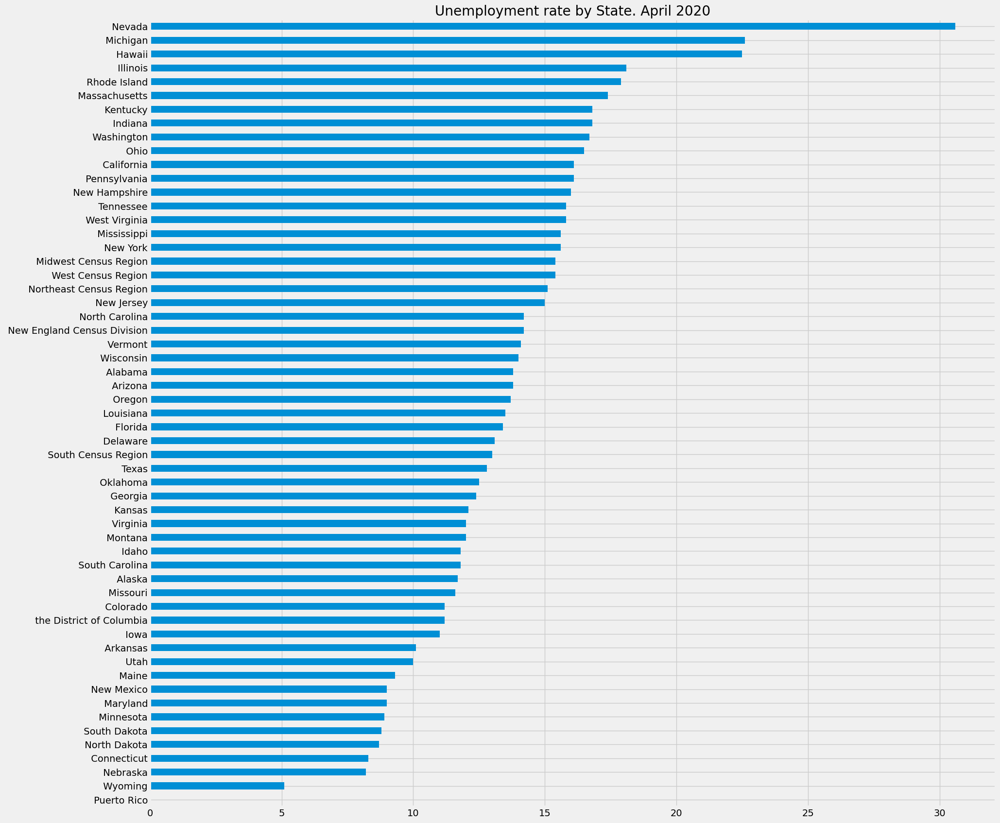

In [17]:
ax = unemp_states.loc[unemp_states.index == '2020-04-01'].T.sort_values('2020-04-01') \
    .plot(kind='barh', figsize=(20, 20), title = 'Unemployment rate by State. April 2020')

ax.legend().remove()
plt.show()

# Pull participation rate

In [18]:
part_df = fred.search('participation rate state', filter=('frequency', 'Monthly'))
part_df = part_df.query('seasonal_adjustment == "Seasonally Adjusted" and units == "Percent"')
part_df = part_df[part_df['title'].str.contains('Labor Force Participation Rate for')]

In [19]:
all_results=[]
for item in part_df.index:
    results = fred.get_series(item).to_frame(item)
    all_results.append(results)

part_stats = pd.concat(all_results, axis=1)

In [20]:
id_to_state_participation = part_df['title'].str.replace('Labor Force Participation Rate for', '').to_dict()
part_stats.columns = [id_to_state_participation[c] for c in part_stats.columns]

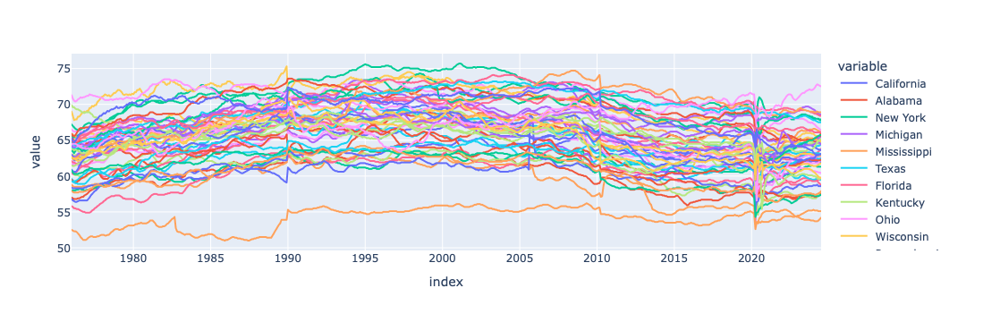

In [21]:
px.line(part_stats)

In [22]:
# Plot Unemployment vs Pariticipation

In [23]:
unemp_states = unemp_states.rename(columns={' the District of Columbia' : ' District Of Columbia'})

In [24]:
unemp_states.drop(columns=[' Midwest Census Region', ' South Census Region',\
                           ' Northeast Census Region', ' West Census Region',\
                           ' New England Census Division', ' Puerto Rico'], inplace=True)

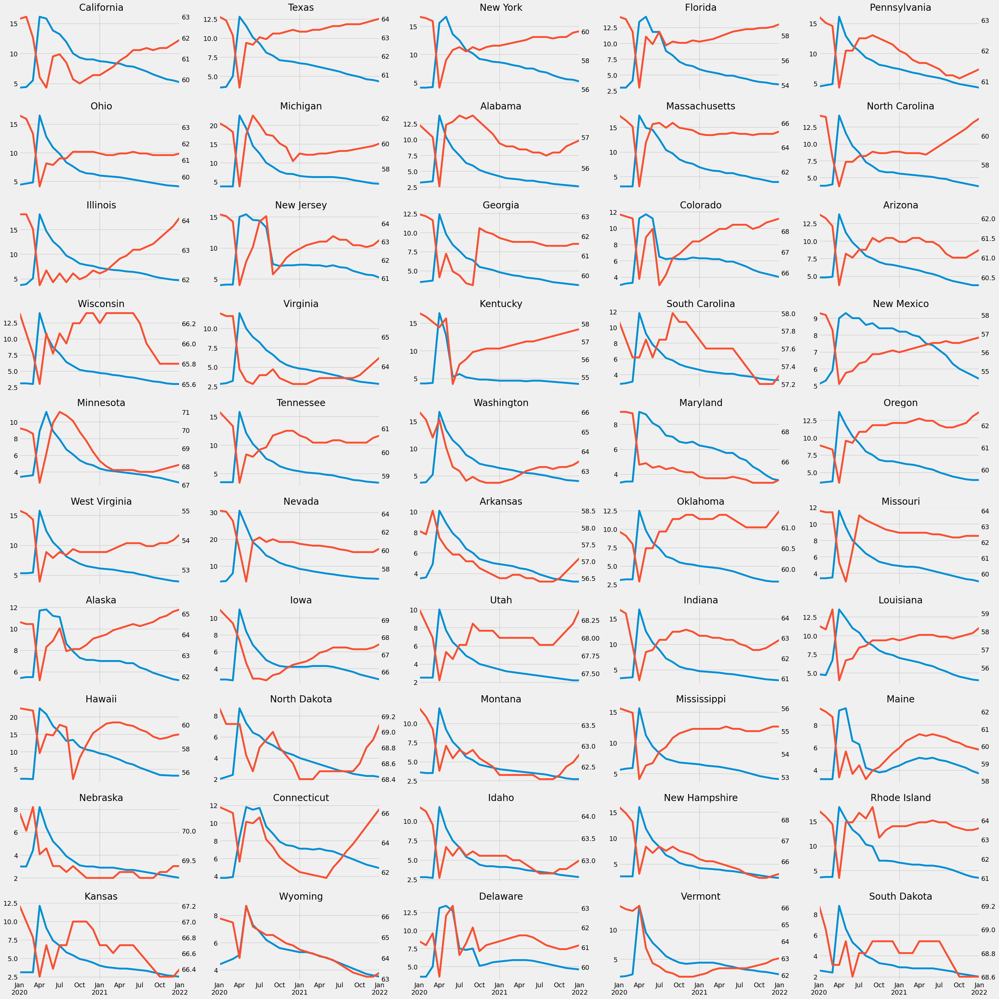

In [25]:
fig, axs = plt.subplots(10, 5, figsize=(30, 30), sharex=True)
axs = axs.flatten()

i = 0
for state in unemp_states.columns:
    if state == " District Of Columbia":
        continue
    ax2 = axs[i].twinx()
    unemp_states.query('index >= 2020 and index <= 2022')[state].plot(ax=axs[i])
    part_stats.query('index >= 2020 and index <= 2022')[state].plot(ax=ax2, color=color_pal[1])
    ax2.grid(False)
    axs[i].set_title(state)
    i += 1
plt.tight_layout()
plt.show()

In [26]:
unemp_states.shape, part_stats.shape

((583, 51), (583, 51))